## SpaGFT Tutorial：Visium Human Lymph Node

### Outline
1. Import module
2. Load data and preprocessing
3. Detect spatially variable genes
4. Detect tissue modules
5. Enhance gene expression

The installation step can be found in [here](https://spagft.readthedocs.io/en/latest/Installation.html).
SpaGFT is a python package to analysis spatial transcriptomics data. To install SpaGFT, the python version is requried to >= 3.7. You can check your python version by:

In [1]:
import platform
platform.python_version()

'3.8.0'

### 1. Import packages

In [2]:
import SpaGFT as spg
import numpy as np
import pandas as pd
import scanpy as sc
import os
import matplotlib.pyplot as plt

sc.settings.verbosity = 3      
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.5 scipy==1.8.0 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.10 louvain==0.7.1 pynndescent==0.5.7


Define the folter to save save the results:

In [3]:
results_folder = './results/lymph_nodes_analysis/'

### 2. Loading Visium data

In this toturial, we use a publice avaiable Visium dataset of the Human lymph node. The dataset could be downloaded easily by [scanpy](https://scanpy.readthedocs.io/en/stable/). Two kye elements are essential for running SpaGFT, including raw gene count matrix and spatial coordinates of spots. The basis object inputing to SpaGFT should be _anndata_ object which contains above two elements.

In [4]:
# Load data
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var_names_make_unique()
# Add raw to anndata object
adata.raw = adata

reading /mnt/c/Users/frank/Desktop/SpaGFT_codes/docs/data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5
 (0:00:01)


Your can construct your _anndata_ object ```adata``` containing your dataset. Note that, the raw count matrix should be found in ```adata.X``` And the spatial coordinates of all spots should be found in ```adata.obs``` or ```adata.obsm```.
You can use various functions to create _anndata_ object which contains your datasets, such as:
```
sc.read_visium()
```

The simplest case, you can construct _anndata_ object using raw count matrix and spatial coordinates of spots only. For example, if you have
```
count_mtx = pd.DataFrame(adata.X.toarray(), index=adata.obs_names, columns=adata.var_names)
coord_mtx = pd.DataFrame(adata.obsm['spatial'], index=adata.obs_names, columns=['x', 'y'])
count_mtx.iloc[:5, :5]
coord_mtx.iloc[:5, :5]
```
create _anndata__ object by
```
adata = sc.AnnData(count_mtx)
adata.obs[['x', 'y']] = coord_mtx
adata.var_names_make_unique()
adata.raw = adata
```

### 3. QC and preprocessing

Normalize Visium counts data with the built-in normalize_total method from scanpy and filter genes which express less than 10 spots. And user can also adjust preprocessing schemes for diverse purposes. However, ensure that each gene in ```adata.var_names``` should express at least one spot.

In [5]:
# QC
sc.pp.filter_genes(adata, min_cells=10)
# Normalization
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

filtered out 16788 genes that are detected in less than 10 cells
normalizing counts per cell
    finished (0:00:00)


### 4. Function: Identify spatially variable genes

SpaGFT identifies spatially variable genes by graph Fourier transfrom. There are three key paramters, that are, _ratio_low_freq_ which controls how many the low-frequency Fourier modes (FM) used and the number of FMs used is _ratio_low_freq_ * $\sqrt{n}$ to measure various spatial patterns; _ratio_high_freq_ which controls how many the high-frequency Fourier modes (FM) used and the number of FMs used is _ratio_high_freq_ * $\sqrt{n}$ to measure noises; _ratio_neighbors_ which determines the $K$ when construct KNN graph by $K=$ratio_neighbors * $\sqrt{n}/2$. These parameters should be set to around one.

If spatial coordinate information of all spots in ```adata.obsm```, set ```spatial_info``` in ```spg.rank_gene_smooth``` as the key in ```adata.obsm.keys()``` indicating spatial coordinates. Otherwise, set ```spatial_info``` as the columns in ```adata.obs.columns()``` indicating spatial coordinates.

In [6]:
gene_df = spg.rank_gene_smooth(adata,
                                ratio_low_freq=0.5,
                                ratio_high_freq=3,
                                ratio_neighbors=1,
                                spatial_info=['array_row', 'array_col'])

Graph Fourier Transform finished!
SVG ranking could be found in adata.obs['Rank']
The spatially variable genes judged by gft_score could be found in adata.obs['cutoff_gft_score']
Gene signals in frequency domain could be found in adata.varm['freq_domain_svg']


In [7]:
gene_df.iloc[:5, :]

,gene_ids,feature_types,genome,n_cells,gft_score,svg_rank,cutoff_gft_score,pvalue,qvalue
TMSB4X,ENSG00000205542,Gene Expression,GRCh38,4033,6.814512,1,True,7.736596e-38,3.086732e-34
EEF1A1,ENSG00000156508,Gene Expression,GRCh38,4031,6.389332,2,True,2.281886e-37,5.319321e-34
MT-CO2,ENSG00000198712,Gene Expression,GRCh38,4030,6.176624,3,True,7.736596e-38,3.086732e-34
IFI44L,ENSG00000137959,Gene Expression,GRCh38,1882,5.931681,4,True,7.736596e-38,3.086732e-34
MT-CO1,ENSG00000198804,Gene Expression,GRCh38,4024,5.904822,5,True,7.736596e-38,3.086732e-34


The SVGs can be extracted by 

In [8]:
svg_list = gene_df[gene_df.cutoff_gft_score][gene_df.qvalue < 0.05].index.tolist()
print(svg_list[:5])
print(len(svg_list))

['TMSB4X', 'EEF1A1', 'MT-CO2', 'IFI44L', 'MT-CO1']
1490


We can visiulize gene expression on spots easily if you load your dataset by _sc.read_visium()_ to enable containing image information by

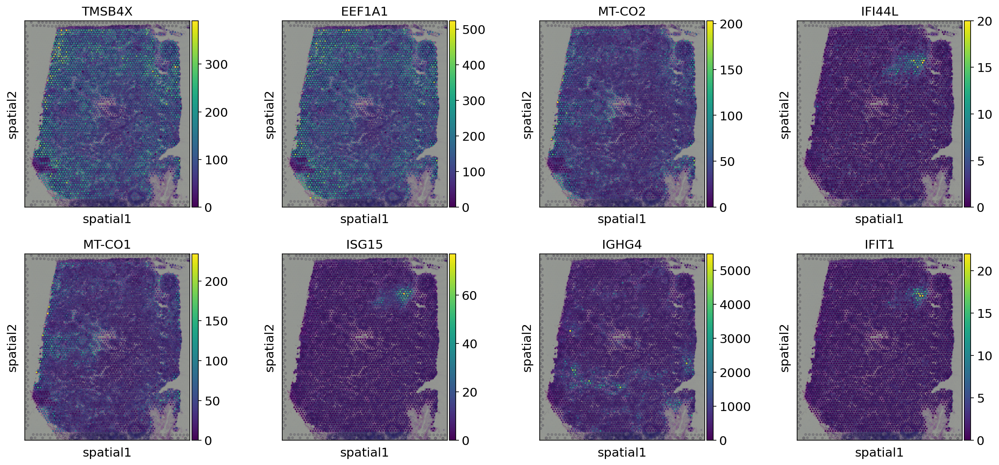

In [9]:
# top 8 SVGs according to gft_score
sc.pl.spatial(adata, color=svg_list[:8])

### 5. Function: Detect tissue modules

One core function of SpaGFT is identifying tissue modules (TM). SpaGFT achieve this function by group SVGs with similar spatial patterns in frequency/spectral domain by graph Fourier Transform.

In [10]:
# detect tissue_module
spg.gft.find_tissue_module(adata, 
                          ratio_fms=2,
                          ratio_neighbors=1)

Gene signals in frequency domain could be found in  adata.varm['freq_domain']
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain', the cluster labels (adata.obs, cat

In [11]:
# tissue module information can be found in adata.var, where 'tissue_module' in adata.var indicates the gene groups which genes belong to.
# and a group SVGs can reaveals a tissue module
gene_df = adata.var
gene_df = gene_df.loc[svg_list, :]
gene_df.iloc[:10, :]

,gene_ids,feature_types,genome,n_cells,gft_score,svg_rank,cutoff_gft_score,pvalue,qvalue,tissue_module,sub_TM
TMSB4X,ENSG00000205542,Gene Expression,GRCh38,4033,6.814512,1,True,7.736596e-38,3.086732e-34,4,1
EEF1A1,ENSG00000156508,Gene Expression,GRCh38,4031,6.389332,2,True,2.281886e-37,5.319321e-34,4,1
MT-CO2,ENSG00000198712,Gene Expression,GRCh38,4030,6.176624,3,True,7.736596e-38,3.086732e-34,4,2
IFI44L,ENSG00000137959,Gene Expression,GRCh38,1882,5.931681,4,True,7.736596e-38,3.086732e-34,9,2
MT-CO1,ENSG00000198804,Gene Expression,GRCh38,4024,5.904822,5,True,7.736596e-38,3.086732e-34,4,2
ISG15,ENSG00000187608,Gene Expression,GRCh38,3054,5.767193,6,True,7.736596e-38,3.086732e-34,9,2
IGHG4,ENSG00000211892,Gene Expression,GRCh38,4034,5.755907,7,True,7.736596e-38,3.086732e-34,3,3
IFIT1,ENSG00000185745,Gene Expression,GRCh38,828,5.660028,8,True,7.736596e-38,3.086732e-34,9,2
MT-CO3,ENSG00000198938,Gene Expression,GRCh38,4030,5.613620,9,True,7.736596e-38,3.086732e-34,4,2
IGLON5,ENSG00000142549,Gene Expression,GRCh38,14,5.604165,10,True,2.830578e-37,5.387668e-34,2,1


You can also obtain pseudo expression or binary region information of these TMs by

In [12]:
# pseudo expression
tm_expression_df = adata.obsm['tm_expression']
tm_expression_df.iloc[:5, :]

,tm_1,tm_2,tm_3,tm_4,tm_5,tm_6,tm_7,tm_8,tm_9
AAACAAGTATCTCCCA-1,516.095154,8.253227,246.347397,464.334167,253.605194,113.108414,109.035988,147.017090,75.279533
AAACAATCTACTAGCA-1,524.191345,7.965546,168.855804,506.076324,274.250336,116.342194,190.557938,110.100113,84.869804
AAACACCAATAACTGC-1,670.044739,17.158781,319.966644,549.002258,314.658691,160.154358,144.889297,203.464401,114.125793
AAACAGAGCGACTCCT-1,620.951416,11.325922,178.880219,529.247681,278.643616,152.363831,131.871094,169.414444,209.665115
AAACAGCTTTCAGAAG-1,528.632751,7.167038,170.468994,541.659058,272.399078,108.769516,95.212196,177.531174,91.823479


In [13]:
# Binary region
tm_region_df = adata.obsm['tm_region']
tm_region_df.iloc[:5, :]

,tm_1,tm_2,tm_3,tm_4,tm_5,tm_6,tm_7,tm_8,tm_9
AAACAAGTATCTCCCA-1,0,0,1,0,0,0,0,0,0
AAACAATCTACTAGCA-1,0,0,0,1,1,0,1,0,0
AAACACCAATAACTGC-1,1,1,1,1,1,1,1,1,1
AAACAGAGCGACTCCT-1,1,0,0,1,1,1,0,1,1
AAACAGCTTTCAGAAG-1,0,0,0,1,1,0,0,1,1


We can visiulize TMs on spots easily if you load your dataset by _sc.read_visium()_ to enable containing image information by

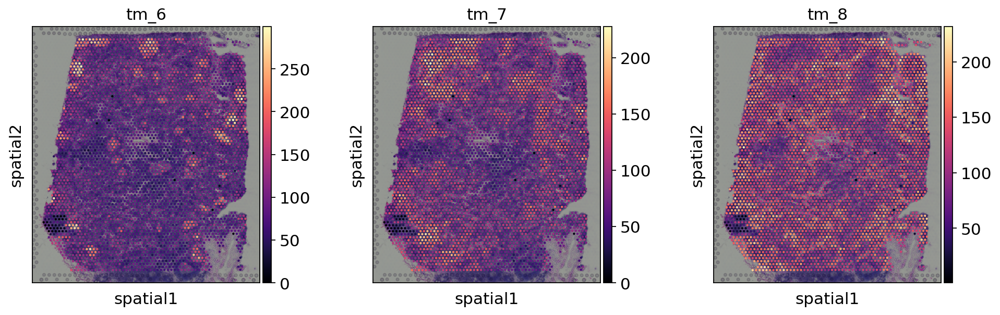

In [14]:
adata.obs[tm_expression_df.columns] = tm_expression_df
sc.pl.spatial(adata, color=['tm_6', 'tm_7', 'tm_8'], cmap='magma')

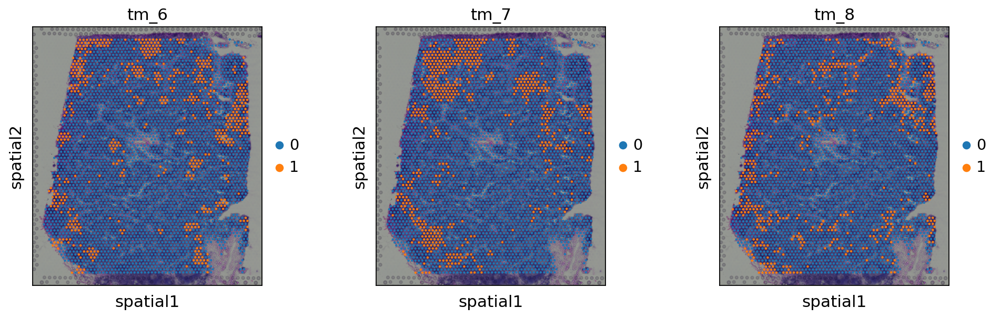

In [15]:
tm_region_df = tm_region_df.astype(int)
tm_region_df =tm_region_df.astype(str)
adata.obs[tm_region_df.columns] = tm_region_df
sc.pl.spatial(adata, color=['tm_6', 'tm_7', 'tm_8'], cmap='RdYlBu_r')

### 6. Enhancement

Note: this step may consume a few minutes to Visium datasets.

In [16]:
new_adata = adata.copy()
new_count = spg.low_pass_enhancement(new_adata,
                                     ratio_low_freq=15,
                                     inplace=True)

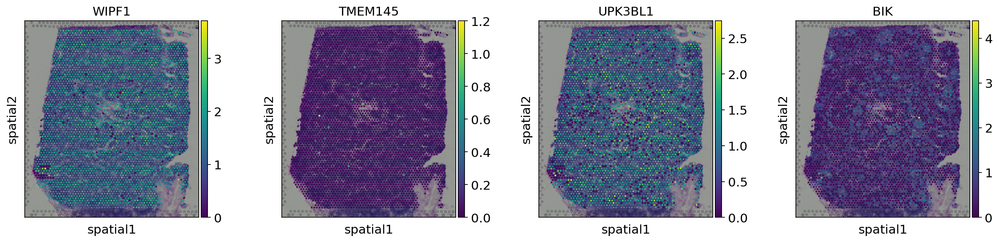

In [17]:
# Before enhancement
sc.pl.spatial(adata, color=svg_list[1000:1004], use_raw=False)

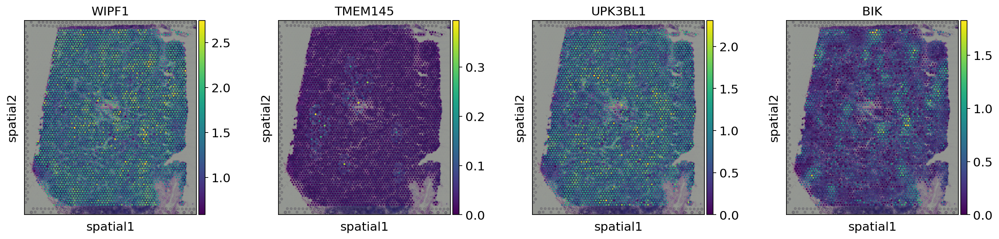

In [18]:
# After enhancement
sc.pl.spatial(new_adata, color=svg_list[1000:1004],use_raw=False)